<a href="https://colab.research.google.com/github/Mediumunwell/Apollo-13-Project/blob/main/eshipley_FreeParticleWavepacket_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gaussian Wavepackets and Free Particles

We'll start with some standard imports and define some units. These are the values I ended up with and they give sensible scales for the default plots below. I make no claim that I'm making *good* choices here, just ones that
work OK

In [3]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.figure import Figure

%matplotlib inline

nm=1; #set x distance scale. Lets set it to nm
ps=0.3; #set time scale
hbar=1; #sets momentum scale, one momentum unit will be hbar/nm
p_unit=hbar/nm

## Momentum Space

Now lets define a momentum-space wavefunction $\phi(p)$. We are expecting to
feed it a list of values $p_k$ and single scalar values for $p_0, \sigma_p, x_0$

In [4]:
def wfn_pspace(p, p0, sigma_p, x0):
    #phi is not necessarily real-valued. so we return a real and imaginary part!

    #don't forget you need to return a value for *every* p, so your
    #output has to be the same dimension as p
    #here's a little nonsense example: a step function times a position
    #eigenstate!

    re_part=0*p
    im_part=0*p
    q=(np.abs(p-p0) < sigma_p)
    re_part=q*np.cos(-p*x0/hbar)/np.sqrt(2*np.pi*hbar)
    im_part=q*np.sin(-p*x0/hbar)/np.sqrt(2*np.pi*hbar)



    return re_part,im_part

To think about: we didn't have an imaginary part when we did this in class. What happened to the imaginary part in that case?

we took x0 = 0 so the phase factor and the imaginary part vanished.

In [11]:
#choosing some parameters to feed into my momentum space wavefunction
my_p0=4*p_unit
my_width=0.6*p_unit
my_x0=5*nm

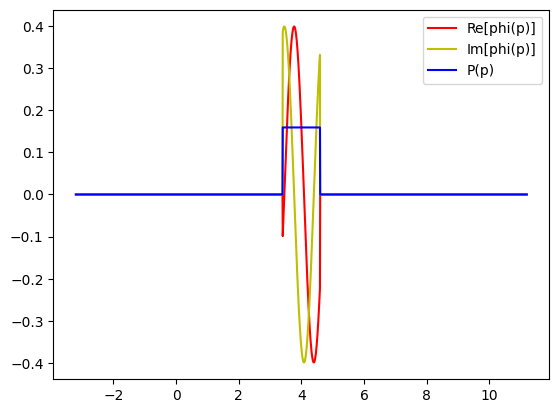

In [12]:
#now lets plot it to see if we did it right!
p=np.linspace(my_p0-12*my_width,my_p0+12*my_width,2000)
phi=wfn_pspace(p,my_p0,my_width,my_x0)
#what happens when x0 isn't 0? try it here, (maybe x0=-1? or 2? or 5?)

# Changing x0 only adds a phase to the wavefunction. A phase changes the real and
# imaginary parts, which is why the red and yellow curves move around, but it does
# not change the probability. That is why the blue curve stays the same no matter
# what x0 is.

#then rerun the position-space plots when you have the fourier integral done

fig=plt.figure()
ap=fig.add_subplot(1,1,1)
plt.plot(p,phi[0],'r',label="Re[phi(p)]")
plt.plot(p,phi[1],'y',label="Im[phi(p)]")
plt.plot(p,phi[0]*phi[0]+phi[1]*phi[1],'b',label="P(p)")
plt.legend(loc="upper right")

Now we move to position space. Note first that we've already discritized $p$. I can prove it:

In [13]:
print(p[int(len(p)/2):int(len(p)/2)+20])

[4.0036018  4.0108054  4.018009   4.02521261 4.03241621 4.03961981
 4.04682341 4.05402701 4.06123062 4.06843422 4.07563782 4.08284142
 4.09004502 4.09724862 4.10445223 4.11165583 4.11885943 4.12606303
 4.13326663 4.14047024]


In [14]:
print(phi[0][int(len(p)/2):int(len(p)/2)+20])

[ 0.15621604  0.1428959   0.12939041  0.11571708  0.10189364  0.08793803
  0.07386835  0.05970286  0.04545992  0.03115801  0.01681568  0.00245154
 -0.01191578 -0.02626764 -0.04058543 -0.05485057 -0.06904456 -0.083149
 -0.09714557 -0.11101613]


## Position Space

To get the position space wavefunction, we do a fourier integral to transform
$\phi(p)\mapsto\psi(x)$

We've already discretized momentum (if you print p, it is an array of 2k discrete values), so our Fourier *integral* can be written as a *sum*, here indexed by $k$. Note that the $dp$ is still important to get everything
normalized properly!

To implement this in the most general case, remember that your integrand is
a product of two complext numbers, so you have *four* terms from FOIL, two
real and two imaginary! You'll need to keep them straight if you don't want
to be forced to stick to real $\phi(p)$!

Anyway, the technical bit: we expect as input parameters:

*   an array of $x_j$ values,
*   an array of $p_k$ values which may have a different length than the $x_j$ array
*   an array of $\phi_k$ values with $len(\phi_k)=len(p_k)$,
*   a scalar value for time $t$.

Note the time parameter. I'd like you to try to
put in the correct integrand to get $\psi(x,t)$, not just $\psi(x,0)$ so you can
plot at different times to see dispersion

In [17]:
def wfn_xspace(x, p,phi,t):
    norm = 1/np.pow(2*np.pi*hbar,0.5)
    psi_real=0*x #blank psi with right dimension
    psi_im=0*x #blank psi with right dimension
    dp=(p[1]-p[0])
    for k in range(len(p)):
        #fourier integral becomes a sum over p
        #implement the integrand yourself!
        pk = p[k]
        A = phi[0][k]   # real part of φ(k)
        B = phi[1][k]   # imaginary part of φ(k)
        E = 0.5 * pk * pk
        theta = (pk*x - E*t)/hbar   # phase factor: (p*x - E*t)/ħ
        c = np.cos(theta)
        s = np.sin(theta)

        # multiply (A + iB) by (cosθ + i sinθ)
        this_real = A*c - B*s
        this_imag = A*s + B*c

        psi_real += this_real * dp
        psi_im   += this_imag * dp
        psi_real+= this_real * dp # <- this needs an real part of integrand times dp
        psi_im+= this_imag * dp # <- this needs an imaginary part of integrand times dp

    psi_real=psi_real*norm
    psi_im=psi_im*norm
    return psi_real,psi_im



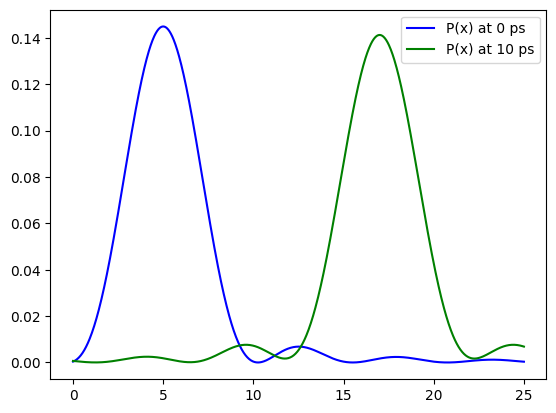

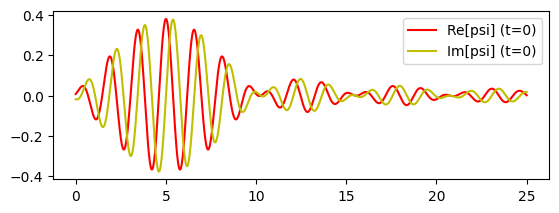

In [18]:
#here's some sensible default plots for you

x=np.linspace(my_x0-5*nm,my_x0+20*nm,1000) #you may have to modify this range if you
                                # want to go to longer times or negative p0
psi=wfn_xspace(x,p,phi,0)
fig=plt.figure()
ap=fig.add_subplot(1,1,1)
#absolute square = re^2 + im^2
plt.plot(x,psi[0]*psi[0]+psi[1]*psi[1],'b',label="P(x) at 0 ps")

#10 ps later, feel free to try different times!
psi10=wfn_xspace(x,p,phi,10*ps)
plt.plot(x,psi10[0]*psi10[0]+psi10[1]*psi10[1],'g', label="P(x) at 10 ps")

plt.legend(loc="upper right")
fig=plt.figure()
ab=fig.add_subplot(2,1,1)
#while we're plotting, lets add the real and im parts of the wavefunction!
plt.plot(x,psi[0],'r',label="Re[psi] (t=0)")
plt.plot(x,psi[1],'y',label="Im[psi] (t=0)")
plt.legend(loc="upper right")

What now?

Try different $\phi(p)$ once you have the gaussian case working! Maybe
run over that step function placeholder I had?

Another nice wavepacket form you might consider trying is $\frac{\sigma^2_p}{(p-p_0)^2+\sigma^2_p}$ (a Lorentzian peak), as it has another known
fourier transform. Don't feel the need to stick to known functions though,
the fun of a script like this is to plug in weird shapes!

A different direction to take it if you are good with python is to
figure out how to animate $\psi(x,t)$ with time, or at least represent
it in a better way than I did!

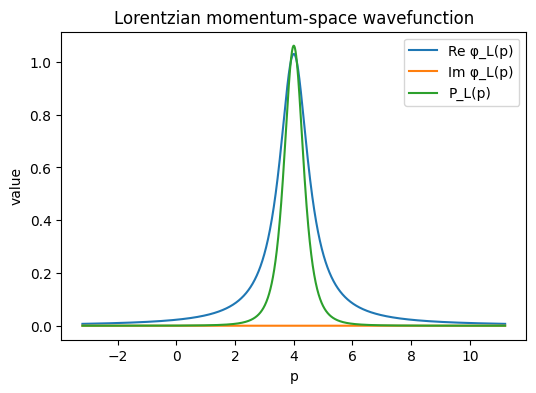

In [22]:
# Lorentzian momentum-space wavefunction
def wfn_pspace_lorentzian(p, p0, sigma_p, x0):
    """
    Build a Lorentzian-shaped φ(p) centered at p0 with width sigma_p,
    and a phase that depends on x0.
    """
    # basic Lorentzian shape in momentum
    denom = (p - p0)**2 + sigma_p**2
    amp = sigma_p**2 / denom

    # add the position-dependent phase factor
    phase = np.exp(-1j * p * x0 / hbar)

    # complex momentum wavefunction before normalization
    phi_complex = amp * phase

    # normalize numerically so ∫ |φ(p)|^2 dp = 1
    dp = p[1] - p[0]
    norm = np.sqrt(np.sum(np.abs(phi_complex)**2) * dp)
    phi_complex = phi_complex / norm

    # store real and imaginary parts in the same format as before
    phi = np.zeros((2, len(p)))
    phi[0, :] = np.real(phi_complex)
    phi[1, :] = np.imag(phi_complex)

    Pp = np.abs(phi_complex)**2  # probability in momentum space
    return phi, Pp

# Example: build and plot the Lorentzian packet
p0_l = 4.0 * p_unit     # center momentum
sigma_p_l = 0.6 * p_unit
x0_l = 0.0

phi_lorentz, Pp_lorentz = wfn_pspace_lorentzian(p, p0_l, sigma_p_l, x0_l)

plt.figure(figsize=(6,4))
plt.plot(p, phi_lorentz[0], label="Re φ_L(p)")
plt.plot(p, phi_lorentz[1], label="Im φ_L(p)")
plt.plot(p, Pp_lorentz, label="P_L(p)")
plt.xlabel("p")
plt.ylabel("value")
plt.legend()
plt.title("Lorentzian momentum-space wavefunction")
plt.show()

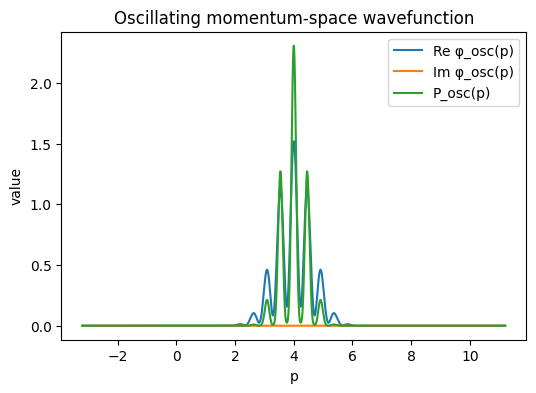

In [25]:
# Oscillatory momentum-space wavefunction (Gaussian envelope with oscillations)
def wfn_pspace_oscillating(p, p0, sigma_p, x0, n_osc=6):
    """
    Build an oscillating φ(p): a Gaussian envelope times a cosine modulation.
    This gives a more "bouncy" / structured packet in momentum.
    """
    # Gaussian envelope
    env = np.exp(-0.5 * ((p - p0)/sigma_p)**2)

    # Oscillatory modulation in momentum space
    # n_osc controls how many wiggles we get across the peak
    mod = 1.0 + 0.8 * np.cos(n_osc * (p - p0) / sigma_p)

    amp = env * mod

    # position-dependent phase (same idea as before)
    phase = np.exp(-1j * p * x0 / hbar)

    phi_complex = amp * phase

    # normalize so ∫ |φ(p)|^2 dp = 1
    dp = p[1] - p[0]
    norm = np.sqrt(np.sum(np.abs(phi_complex)**2) * dp)
    phi_complex /= norm

    # store as [real, imag]
    phi = np.zeros((2, len(p)))
    phi[0, :] = np.real(phi_complex)
    phi[1, :] = np.imag(phi_complex)

    Pp = np.abs(phi_complex)**2
    return phi, Pp

# Example: oscillating packet
p0_osc = 4.0 * p_unit
sigma_p_osc = 0.6 * p_unit
x0_osc = 0.0

phi_osc, Pp_osc = wfn_pspace_oscillating(p, p0_osc, sigma_p_osc, x0_osc, n_osc=8)

plt.figure(figsize=(6,4))
plt.plot(p, phi_osc[0], label="Re φ_osc(p)")
plt.plot(p, phi_osc[1], label="Im φ_osc(p)")
plt.plot(p, Pp_osc, label="P_osc(p)")
plt.xlabel("p")
plt.ylabel("value")
plt.legend()
plt.title("Oscillating momentum-space wavefunction")
plt.show()

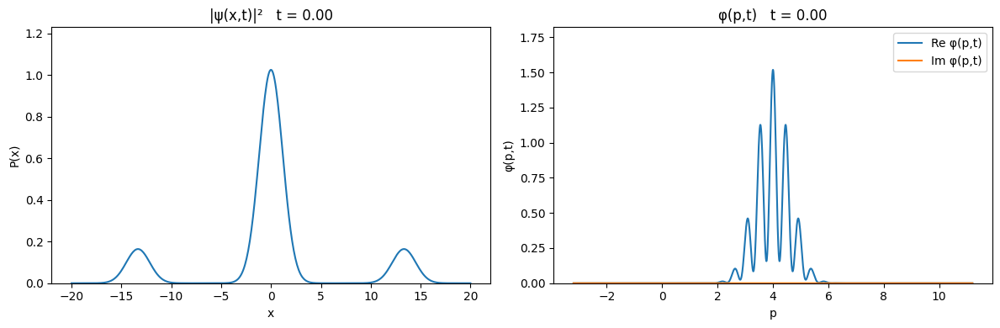

In [27]:
from matplotlib import animation
from IPython.display import HTML

# x grid
x_min, x_max = -20.0, 20.0
nx = 500
x = np.linspace(x_min, x_max, nx)

# time parameters
t_max = 10.0
n_frames = 120
dt = t_max / n_frames

# choose which φ(p) to animate: oscillating packet here
phi_anim = phi_osc           # try phi_lorentz or your Gaussian if you like
phi0_complex = phi_anim[0] + 1j * phi_anim[1]

E_p = 0.5 * p**2   # free particle, mass = 1

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# --- initial position-space probability ---
psi_r0, psi_i0 = wfn_xspace(x, p, phi_anim, t=0.0)
Px0 = psi_r0**2 + psi_i0**2
line_psi, = ax1.plot(x, Px0)
ax1.set_xlabel("x")
ax1.set_ylabel("P(x)")
ax1.set_title("|ψ(x,t)|²")
# FIXED y-limits: use initial max and keep it
ax1.set_ylim(0, 1.2 * Px0.max())

# --- initial momentum-space real and imaginary parts ---
phi_r0 = np.real(phi0_complex)
phi_i0 = np.imag(phi0_complex)
line_phi_r, = ax2.plot(p, phi_r0, label="Re φ(p,t)")
line_phi_i, = ax2.plot(p, phi_i0, label="Im φ(p,t)")
ax2.set_xlabel("p")
ax2.set_ylabel("φ(p,t)")
ax2.set_title("φ(p,t)")
ax2.legend()
# FIXED y-limits for momentum too
ymax_phi = 1.2 * max(np.max(phi_r0), np.max(phi_i0))
ymin_phi = 1.2 * min(np.min(phi_r0), np.min(phi_i0))
ax2.set_ylim(ymin_phi, ymax_phi)

plt.tight_layout()

def update(frame):
    t = frame * dt

    # position space update
    psi_r, psi_i = wfn_xspace(x, p, phi_anim, t)
    Px = psi_r**2 + psi_i**2
    line_psi.set_ydata(Px)
    ax1.set_title(f"|ψ(x,t)|²   t = {t:.2f}")

    # momentum space phase evolution
    phase_t = np.exp(-1j * E_p * t / hbar)
    phi_t = phi0_complex * phase_t
    line_phi_r.set_ydata(np.real(phi_t))
    line_phi_i.set_ydata(np.imag(phi_t))
    ax2.set_title(f"φ(p,t)   t = {t:.2f}")

    return line_psi, line_phi_r, line_phi_i

anim = animation.FuncAnimation(
    fig, update, frames=n_frames, interval=80, blit=False, repeat=False
)

HTML(anim.to_jshtml())

In [49]:
# Oscillating momentum-space wavefunction: Gaussian envelope with cosine wiggles
def build_oscillating_packet(p, p0, sigma_p, x0, n_osc=8):
    """
    Build a momentum-space wavefunction φ(p) with a Gaussian envelope
    multiplied by a cosine modulation. This gives a more "bouncy" packet.
    Returns:
        phi   : array shape (2, len(p)) with [Re φ, Im φ]
        phi_c : complex φ(p)
        Pp    : |φ(p)|^2
    """
    # Gaussian envelope
    env = np.exp(-0.5 * ((p - p0)/sigma_p)**2)

    # Cosine modulation to make it oscillate in momentum space
    env *= (1.0 + 0.8 * np.cos(n_osc * (p - p0)/sigma_p))

    # Position-dependent phase sets x0
    phase = np.exp(-1j * p * x0 / hbar)

    phi_c = env * phase

    # Normalize so ∫|φ|^2 dp = 1
    dp = p[1] - p[0]
    norm = np.sqrt(np.sum(np.abs(phi_c)**2) * dp)
    if norm != 0:
        phi_c /= norm

    phi = np.zeros((2, len(p)))
    phi[0, :] = np.real(phi_c)
    phi[1, :] = np.imag(phi_c)
    Pp = np.abs(phi_c)**2
    return phi, phi_c, Pp

# Choose parameters for the packet
p0   = 4.0 * p_unit      # center momentum
sigp = 0.6 * p_unit      # width in momentum
x0   = 0.0               # initial position
n_osc = 8                # number of wiggles in momentum

phi_osc, phi_osc_c, Pp_osc = build_oscillating_packet(p, p0, sigp, x0, n_osc)

In [52]:
from matplotlib import animation
from IPython.display import HTML
from matplotlib.patches import Circle

# --- basic settings ---
num_dials = 8          # number of phase dials
n_frames  = 80         # fewer frames so embedding stays small
dt        = 0.05       # time step per frame

# position grid
x_min, x_max = -20.0, 20.0
nx = 250
x = np.linspace(x_min, x_max, nx)

# free-particle energy: E(p) = p^2 / 2 (mass = 1)
E_p = 0.5 * p**2

# initial ψ(x,0) for y-scaling
psi_r0, psi_i0 = wfn_xspace(x, p, phi_osc, t=0.0)
Px0 = psi_r0**2 + psi_i0**2
Px_ymax = 1.2 * Px0.max() if Px0.max() > 0 else 1.0

# initial φ(p,0)
phi_t0 = phi_osc_c * np.exp(-1j * E_p * 0.0 / hbar)
phi_r0 = np.real(phi_t0)
phi_i0 = np.imag(phi_t0)
phi_ymax = 1.2 * max(np.max(phi_r0), np.max(phi_i0), 1e-6)
phi_ymin = 1.2 * min(np.min(phi_r0), np.min(phi_i0), -1e-6)

# --- figure with 3 rows ---
fig, (ax_psi, ax_phi, ax_dials) = plt.subplots(3, 1, figsize=(7, 10))

# top: |ψ(x,t)|²
line_psi, = ax_psi.plot(x, Px0)
ax_psi.set_xlabel("x")
ax_psi.set_ylabel("P(x)")
ax_psi.set_title("|ψ(x,t)|², t = 0.00")
ax_psi.set_ylim(0, Px_ymax)

# middle: Re φ, Im φ
line_phi_r, = ax_phi.plot(p, phi_r0, label="Re φ(p,t)")
line_phi_i, = ax_phi.plot(p, phi_i0, label="Im φ(p,t)")
ax_phi.set_xlabel("p")
ax_phi.set_ylabel("φ(p,t)")
ax_phi.set_title("φ(p,t), t = 0.00")
ax_phi.set_ylim(phi_ymin, phi_ymax)
ax_phi.legend()

# bottom: phase dials
ax_dials.set_aspect("equal")
ax_dials.axis("off")
ax_dials.set_xlim(0, 4)
ax_dials.set_ylim(0, 2)
ax_dials.set_title("Phase dials for selected momentum values")

# choose a handful of momentum indices for dials (near packet center)
spread = 20
center_idx = np.argmin(np.abs(p - p0))
indices = np.linspace(center_idx - spread, center_idx + spread, num_dials, dtype=int)
indices = np.clip(indices, 0, len(p)-1)

dial_centers = []
dial_lines   = []

grid_x = [0.5, 1.5, 2.5, 3.5]
grid_y = [0.5, 1.5]

for m, idx in enumerate(indices):
    cx = grid_x[m % 4]
    cy = grid_y[m // 4]
    circ = Circle((cx, cy), 0.4, fill=False)
    ax_dials.add_patch(circ)

    phase0 = np.angle(phi_t0[idx])  # phase at t=0
    x_end  = cx + 0.35 * np.cos(phase0)
    y_end  = cy + 0.35 * np.sin(phase0)

    line, = ax_dials.plot([cx, x_end], [cy, y_end])
    dial_centers.append((cx, cy, idx))
    dial_lines.append(line)

plt.tight_layout()

# --- animation update ---
def update(frame):
    t = frame * dt

    # update ψ(x,t)
    psi_r, psi_i = wfn_xspace(x, p, phi_osc, t)
    Px = psi_r**2 + psi_i**2
    line_psi.set_ydata(Px)
    ax_psi.set_title(f"|ψ(x,t)|², t = {t:.2f}")

    # update φ(p,t)
    phi_t = phi_osc_c * np.exp(-1j * E_p * t / hbar)
    line_phi_r.set_ydata(np.real(phi_t))
    line_phi_i.set_ydata(np.imag(phi_t))
    ax_phi.set_title(f"φ(p,t), t = {t:.2f}")

    # update phase dials (no slowdown, pure physics – so they spin fast)
    for (cx, cy, idx), line in zip(dial_centers, dial_lines):
        phase = np.angle(phi_t[idx])
        x_end = cx + 0.35 * np.cos(phase)
        y_end = cy + 0.35 * np.sin(phase)
        line.set_data([cx, x_end], [cy, y_end])

    return line_psi, line_phi_r, line_phi_i, *dial_lines

anim = animation.FuncAnimation(
    fig, update, frames=n_frames, interval=80, blit=False, repeat=True
)

plt.close(fig)  # prevent Jupyter from also showing a static copy
HTML(anim.to_jshtml())